In [60]:
import os
import re
from collections import Counter

import anndata
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import enrichrpy.enrichr as een
import enrichrpy.plotting as epl

load in integrated dataset

In [2]:
a = sc.read_h5ad('../data/single_cell/original/count_matrix/counts.h5ad')
a

AnnData object with n_obs × n_vars = 323120 × 34985
    obs: 'sample_id', 'dataset', 'tissue_type'

In [3]:
a.obs

,sample_id,dataset,tissue_type
cell_id,,,
htan01_AAACCTGAGACCTAGG-1,htan01,htan_surgical,tumor_primary
htan01_AAACCTGAGTGCGTGA-1,htan01,htan_surgical,tumor_primary
htan01_AAACCTGCAATCGGTT-1,htan01,htan_surgical,tumor_primary
htan01_AAACCTGCACCGTTGG-1,htan01,htan_surgical,tumor_primary
htan01_AAACCTGCATCCCACT-1,htan01,htan_surgical,tumor_primary
...,...,...,...
G9903_TTTGTCAAGTTGTCGT-1,G9903,chan-seng-yue,tumor_primary
G9903_TTTGTCACAACTTGAC-1,G9903,chan-seng-yue,tumor_primary
G9903_TTTGTCACATATGGTC-1,G9903,chan-seng-yue,tumor_primary


In [4]:
Counter(a.obs['sample_id']).most_common()

[('T19', 11108),
 ('N11', 11078),
 ('N9', 9986),
 ('T24', 9621),
 ('N6', 9286),
 ('wu39', 9175),
 ('N1', 9109),
 ('T2', 8203),
 ('N4', 7918),
 ('T17', 7885),
 ('T13', 7567),
 ('N2', 7498),
 ('T9', 7224),
 ('T11', 6954),
 ('T23', 6947),
 ('T15', 6939),
 ('T18', 6850),
 ('N7', 6718),
 ('N8', 6682),
 ('T22', 5421),
 ('T12', 5094),
 ('T16', 4926),
 ('T6', 4739),
 ('T3', 4401),
 ('N10', 4293),
 ('T20', 4283),
 ('N5', 4230),
 ('htan06', 4145),
 ('T14', 4140),
 ('wu07', 3987),
 ('N3', 3827),
 ('T4', 3819),
 ('T5', 3640),
 ('T7', 3581),
 ('wu16', 3530),
 ('htan05', 3462),
 ('COMP_0158_P', 3159),
 ('T8', 3101),
 ('htan01', 2940),
 ('wu28', 2918),
 ('MET05', 2905),
 ('T1', 2882),
 ('T21', 2792),
 ('100070', 2789),
 ('87235', 2718),
 ('91706', 2662),
 ('97727', 2657),
 ('95092', 2567),
 ('MET06', 2484),
 ('G9903', 2477),
 ('wu26', 2422),
 ('wu27', 2386),
 ('95373', 2362),
 ('91412', 2347),
 ('87784', 2325),
 ('85948', 2323),
 ('T10', 2113),
 ('wu30', 2057),
 ('wu03', 1881),
 ('wu29', 1779),
 ('90

In [5]:
Counter(a.obs['dataset']).most_common()

[('peng', 214855),
 ('eusfnb', 43430),
 ('chan-seng-yue', 33965),
 ('lin', 17086),
 ('htan_surgical', 13784)]

load in epithelial subtypes from iu

In [6]:
epi = sc.read_h5ad('../data/single_cell/iu/epithelial_Subtype_2.h5ad')
epi

/diskmnt/Projects/Users/estorrs/miniconda3/envs/single-cell-pdac/lib/python3.7/site-packages/anndata/compat/__init__.py:235: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,


AnnData object with n_obs × n_vars = 92110 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_id', 'dataset', 'tissue_type', 'percent.mt', 'percent_mito', 'percent_ribo', 'percent_hb', 'percent_plat', 'S.Score', 'G2M.Score', 'Phase', 'pANN_0.25_0.01_5408', 'DF.classifications_0.25_0.01_5408', 'pANN_0.25_0.02_1262', 'DF.classifications_0.25_0.02_1262', 'pANN_0.25_0.001_434', 'DF.classifications_0.25_0.001_434', 'pANN_0.25_0.15_1128', 'DF.classifications_0.25_0.15_1128', 'pANN_0.25_0.01_589', 'DF.classifications_0.25_0.01_589', 'RNA_snn_res.1.5', 'seurat_clusters', 'RNA_snn_res.0.8'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'neighbors'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_tsne_harmony', 'X_umap', 'X_umap_harmony'
    varm: 'HARMONY', 'PCs'
    obsp: 'distances'

In [7]:
epi.obs

,orig.ident,nCount_RNA,nFeature_RNA,sample_id,dataset,tissue_type,percent.mt,percent_mito,percent_ribo,percent_hb,...,DF.classifications_0.25_0.02_1262,pANN_0.25_0.001_434,DF.classifications_0.25_0.001_434,pANN_0.25_0.15_1128,DF.classifications_0.25_0.15_1128,pANN_0.25_0.01_589,DF.classifications_0.25_0.01_589,RNA_snn_res.1.5,seurat_clusters,RNA_snn_res.0.8
PDAC-Peng_N1_AAACCTGAGCTATGCT-1,N1,2044,611,N1,peng,normal,9.74076983503535,9.74076983503535,9.3872741555381,0,...,NA,NA,NA,NA,NA,NA,NA,17,5,4
PDAC-Peng_N1_AAACCTGCAACCGCCA-1,N1,5170,2508,N1,peng,normal,5.41007576764589,5.41007576764589,22.318224112721,0,...,NA,NA,NA,NA,NA,NA,NA,16,2,1
PDAC-Peng_N1_AAACCTGGTCAGATAA-1,N1,6516,2854,N1,peng,normal,8.03095262992785,8.03095262992785,22.9948760849106,0,...,NA,NA,NA,NA,NA,NA,NA,14,2,1
PDAC-Peng_N1_AAACCTGGTCTCTCTG-1,N1,9651,3771,N1,peng,normal,12.5480241492865,12.5480241492865,14.7777167947311,0.00686059275521405,...,NA,NA,NA,NA,NA,NA,NA,16,3,2
PDAC-Peng_N1_AAACGGGAGAAACCGC-1,N1,3702,1995,N1,peng,normal,10.2313810556761,10.2313810556761,21.5654374548084,0,...,NA,NA,NA,NA,NA,NA,NA,16,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lin_P10_TTTGTCAGTTAGTGGG-1,P10,4865,2005,P10,lin,tumor_primary,3.59472773265877,3.59472773265877,28.3051524430835,0.173079483424311,...,NA,NA,NA,NA,NA,0.0306122448979592,Singlet,16,12,11
Lin_P10_TTTGTCAGTTGATTGC-1,P10,3712,1946,P10,lin,tumor_primary,9.0857251473104,9.0857251473104,4.82797947158335,0.20908572514731,...,NA,NA,NA,NA,NA,0.0918367346938776,Singlet,1,12,11
Lin_P10_TTTGTCATCACTGGGC-1,P10,14594,4345,P10,lin,tumor_primary,1.85555466687995,1.85555466687995,34.4157402223466,0.111973126449652,...,NA,NA,NA,NA,NA,0.168367346938776,Singlet,12,12,11
Lin_P10_TTTGTCATCAGAGACG-1,P10,3582,1689,P10,lin,tumor_primary,10.4679602152291,10.4679602152291,28.941790314691,0.211968041741399,...,NA,NA,NA,NA,NA,0.0102040816326531,Singlet,14,12,11


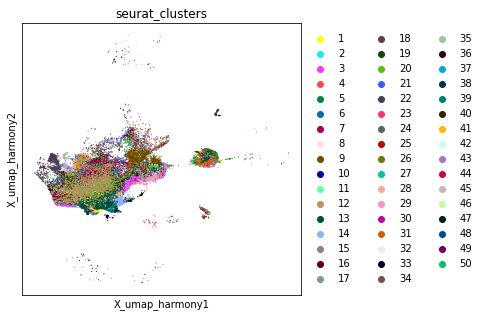

In [8]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.embedding(epi, basis='X_umap_harmony', color=['seurat_clusters'], ax=ax, size=5)

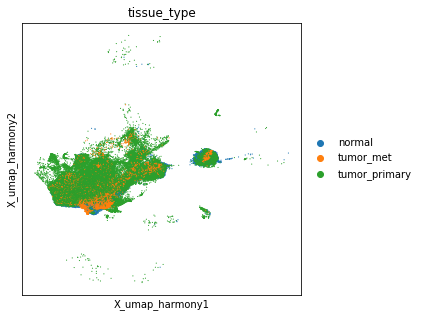

In [9]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.embedding(epi, basis='X_umap_harmony', color=['tissue_type'], ax=ax, size=5)

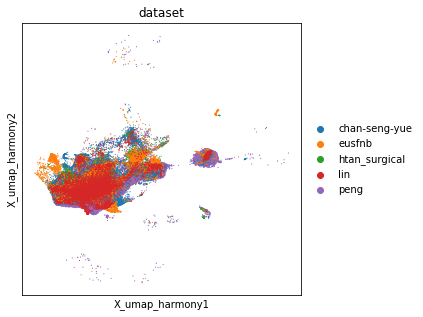

In [10]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.embedding(epi, basis='X_umap_harmony', color=['dataset'], ax=ax, size=5)

processing pipeline

In [11]:
def apply_normalization(adata, perform_filter=False):
    print('normalizing')
    if perform_filter:
        sc.pp.filter_cells(adata, min_genes=200)
        sc.pp.filter_genes(adata, min_cells=3)
        adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
        sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
        adata = adata[adata.obs.pct_counts_mt < 25, :]
    adata.layers['counts'] = adata.X
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=3000)
    adata.raw = adata
    adata = adata[:, adata.var.highly_variable]
    sc.pp.scale(adata)
    
    return adata

def apply_batch_correction(adata):
    print('running pca')
    sc.tl.pca(adata, svd_solver='arpack')
    print('running harmony')
    sce.pp.harmony_integrate(adata, 'dataset')
    
    return adata

def apply_clustering(adata, n_pcs=40, res=2.):
    print('running nbhrs')
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=n_pcs, use_rep='X_pca_harmony')
    print('running umap')
    sc.tl.umap(adata)
    print('running leiden')
    sc.tl.leiden(adata, resolution=res)
    
    return adata
    

batch correct for initial clustering

In [12]:
a = apply_normalization(a, perform_filter=True)
a = apply_batch_correction(a)
a = apply_clustering(a)
a

normalizing


/diskmnt/Projects/Users/estorrs/miniconda3/envs/single-cell-pdac/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


running pca
running harmony


2022-08-18 16:22:11,249 - harmonypy - INFO - Iteration 1 of 10
2022-08-18 16:26:12,172 - harmonypy - INFO - Iteration 2 of 10
2022-08-18 16:30:33,319 - harmonypy - INFO - Iteration 3 of 10
2022-08-18 16:34:59,926 - harmonypy - INFO - Iteration 4 of 10
2022-08-18 16:39:17,934 - harmonypy - INFO - Iteration 5 of 10
2022-08-18 16:43:46,190 - harmonypy - INFO - Converged after 5 iterations


running nbhrs
running umap
running leiden


AnnData object with n_obs × n_vars = 275461 × 3000
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

score for gene signatures

In [13]:
def score_signatures(a, gene_sets, n=50):
    pool = set(a.raw.var.index.to_list())
    for name, v in gene_sets.items():
        for gs, genes in v.items():
            print(name, gs)
            ls = [g for g in genes if g in pool.intersection(set(genes))][:n]
            a.obs[f'{name} | {gs} score'] = np.asarray(a.raw[:, ls].X.mean(axis=1)).flatten()
#             sc.tl.score_genes(a, gene_list=ls, score_name=f'{name} | {gs} score')

In [14]:
# a = sc.read_h5ad('../data/single_cell/annotated/normalized.h5ad')
# a

In [15]:
gene_sets = json.load(open('../data/single_cell/gene_sets/pdac_gene_sets.json'))
gene_sets['luoma'] = {f'{k1} - {k2}':v2 for k1, v1 in gene_sets['luoma'].items() for k2, v2 in v1.items()}

for k, v in gene_sets.items():
    for k2, v2 in v.items():
        print(k, k2, len(v2))

Bailey ADEX 20
Bailey Squamous-like 20
Bailey Pancreatic-Progenitor 20
Bailey Immunogenic 20
Collison Exocrine-like 20
Collison Quasi-Mesenchymal 17
Collison Classical 25
Moffit Basal 20
Moffit Classical 20
subTME deserted 168
subTME reactive 190
raghaven scBasal 30
raghaven scClassical 30
raghaven IC 30
raghaven Pericyte-like 30
raghaven Fibroblast-like 30
raghaven Inflammatory 30
raghaven TAM-FCN1 31
raghaven TAM-C1QC 31
raghaven TAM-SPP1 31
elyada myCAF 16
elyada iCAF 84
elyada apCAF 35
ben-porath ES exp1 380
ben-porath ES exp2 40
ben-porath Nanog targets 988
ben-porath Oct4 targets 290
ben-porath Sox2 targets 734
ben-porath NOS targets 179
ben-porath NOS TFs 37
ben-porath Suz12 targets 1040
ben-porath Eed targets 1066
ben-porath H3K27 bound 1121
ben-porath PRC2 targets 654
ben-porath Myc targets1 230
ben-porath Myc targets2 775
ben-porath Genes functionally associated with proliferation 382
ben-porath Cycling genes 653
ben-porath Proliferation cluster 148
ben-porath ES TFs 68
wong 

In [16]:
score_signatures(a, gene_sets)

Bailey ADEX
Bailey Squamous-like
Bailey Pancreatic-Progenitor
Bailey Immunogenic
Collison Exocrine-like
Collison Quasi-Mesenchymal
Collison Classical
Moffit Basal
Moffit Classical
subTME deserted
subTME reactive
raghaven scBasal
raghaven scClassical
raghaven IC
raghaven Pericyte-like
raghaven Fibroblast-like
raghaven Inflammatory
raghaven TAM-FCN1
raghaven TAM-C1QC
raghaven TAM-SPP1
elyada myCAF
elyada iCAF
elyada apCAF
ben-porath ES exp1
ben-porath ES exp2
ben-porath Nanog targets
ben-porath Oct4 targets
ben-porath Sox2 targets
ben-porath NOS targets
ben-porath NOS TFs
ben-porath Suz12 targets
ben-porath Eed targets
ben-porath H3K27 bound
ben-porath PRC2 targets
ben-porath Myc targets1
ben-porath Myc targets2
ben-porath Genes functionally associated with proliferation
ben-porath Cycling genes
ben-porath Proliferation cluster
ben-porath ES TFs
wong stem_core
sanchez-vega Cell Cycle
sanchez-vega HIPPO
sanchez-vega MYC
sanchez-vega NOTCH
sanchez-vega NRF2
sanchez-vega PI3K
sanchez-vega T

add in iu clusters

In [17]:
epi.obs['converted_ids'] = ['_'.join(x.split('_')[1:]) for x in epi.obs.index]
epi.obs[['converted_ids']]


,converted_ids
PDAC-Peng_N1_AAACCTGAGCTATGCT-1,N1_AAACCTGAGCTATGCT-1
PDAC-Peng_N1_AAACCTGCAACCGCCA-1,N1_AAACCTGCAACCGCCA-1
PDAC-Peng_N1_AAACCTGGTCAGATAA-1,N1_AAACCTGGTCAGATAA-1
PDAC-Peng_N1_AAACCTGGTCTCTCTG-1,N1_AAACCTGGTCTCTCTG-1
PDAC-Peng_N1_AAACGGGAGAAACCGC-1,N1_AAACGGGAGAAACCGC-1
...,...
Lin_P10_TTTGTCAGTTAGTGGG-1,P10_TTTGTCAGTTAGTGGG-1
Lin_P10_TTTGTCAGTTGATTGC-1,P10_TTTGTCAGTTGATTGC-1
Lin_P10_TTTGTCATCACTGGGC-1,P10_TTTGTCATCACTGGGC-1
Lin_P10_TTTGTCATCAGAGACG-1,P10_TTTGTCATCAGAGACG-1


In [18]:
len(set(epi.obs['converted_ids']).intersection(set(a.obs.index)))

92110

In [19]:
mapping = {c:ct for c, ct in zip(epi.obs['converted_ids'], epi.obs['seurat_clusters'])}
a.obs['IU_seurat_clusters'] = [mapping.get(c, None) for c in a.obs.index]

throw on some cnv results from before

In [29]:
from mgitools.os_helpers import listfiles

In [34]:
def deRify_cell_id(cid):
    if cid[0].lower() == 'x':
        cid = cid[1:]
    
    if 'h5.h5' in cid:
        cid = cid.replace('.1', '-1')
    else:
        cid = cid.replace('.', '-')
        
    cid = re.sub(r'^.*_([ATCG]+-1)$', r'\1', cid)
    
    return cid

In [35]:
## read in copy number results
cell_to_copykat = {}
sample_map = {
    '1555-tumor': 'htan01',
    'H_ZY-1105-07': 'htan02',
    'H_ZY-1160-06': 'htan03',
    'H_ZY-1174-06': 'htan04',
    'TWCE-HT055P-S1PAG': 'htan05',
    'TWCE-HT081P1-XB1': 'htan06'
}

fps = sorted(listfiles('../data/single_cell/copycat/outputs/', regex=r'_predictions.txt$'))
for fp in fps:
    sample = fp.split('/')[-1].replace('_predictions.txt', '')
    sample = sample_map.get(sample, sample)
    df = pd.read_csv(fp, sep='\t')
    df = df.set_index('cell.names')
    for k, v in zip(df.index, df['copykat.pred']):
        k = deRify_cell_id(k)
        cell_to_copykat[f'{sample}_{k}'] = v

In [41]:
[x for x in a.obs.index if '100070' in x]

['100070_AAACCTGAGCGTAATA-1',
 '100070_AAACCTGCAATCCGAT-1',
 '100070_AAACCTGCACCGATAT-1',
 '100070_AAACCTGCACTAGTAC-1',
 '100070_AAACGGGAGACTGGGT-1',
 '100070_AAACGGGAGGGTCGAT-1',
 '100070_AAACGGGGTTCAGTAC-1',
 '100070_AAACGGGTCCAAACAC-1',
 '100070_AAAGATGCAGGGAGAG-1',
 '100070_AAAGATGCATCTACGA-1',
 '100070_AAAGCAAAGCTAAACA-1',
 '100070_AAAGCAACATTGCGGC-1',
 '100070_AAAGCAAGTACCGTAT-1',
 '100070_AAAGCAATCTCTAGGA-1',
 '100070_AAAGTAGCAGTAAGCG-1',
 '100070_AAAGTAGCATCAGTAC-1',
 '100070_AAAGTAGCATTGCGGC-1',
 '100070_AAAGTAGGTAAACACA-1',
 '100070_AAAGTAGGTCTGATCA-1',
 '100070_AAAGTAGTCTTCGAGA-1',
 '100070_AAATGCCAGACTCGGA-1',
 '100070_AAATGCCAGTGGAGTC-1',
 '100070_AAATGCCGTGCAACGA-1',
 '100070_AAATGCCTCAATCTCT-1',
 '100070_AAATGCCTCCAGGGCT-1',
 '100070_AAATGCCTCGTCCGTT-1',
 '100070_AAATGCCTCTAACTGG-1',
 '100070_AAATGCCTCTTGAGAC-1',
 '100070_AACACGTGTCCCTTGT-1',
 '100070_AACACGTGTCGACTGC-1',
 '100070_AACACGTGTGCACTTA-1',
 '100070_AACACGTGTTCGCTAA-1',
 '100070_AACACGTGTTGTCTTT-1',
 '100070_A

In [45]:
fps = sorted(listfiles('../data/single_cell/copycat/outputs/', regex=r'_cna.txt$'))

cell_to_cna = {}
for fp in fps:
    print(fp)
    sample = fp.split('/')[-1].replace('_cna.txt', '')
    sample = sample_map.get(sample, sample)
    df = pd.read_csv(fp, sep='\t')
    cnas = np.count_nonzero(np.abs(df.values[:, 3:]) > .2, axis=0) # 99%
    for k, v in zip(df.columns[3:], cnas):
        k = deRify_cell_id(k)
        cell_to_cna[f'{sample}_{k}'] = v

../data/single_cell/copycat/outputs/100070_cna.txt
../data/single_cell/copycat/outputs/1555-tumor_cna.txt
../data/single_cell/copycat/outputs/85948_cna.txt
../data/single_cell/copycat/outputs/87235_cna.txt
../data/single_cell/copycat/outputs/87784_cna.txt
../data/single_cell/copycat/outputs/90209_CMP_cna.txt
../data/single_cell/copycat/outputs/91412_cna.txt
../data/single_cell/copycat/outputs/91610_cna.txt
../data/single_cell/copycat/outputs/91706_cna.txt
../data/single_cell/copycat/outputs/94930_cna.txt
../data/single_cell/copycat/outputs/95092_cna.txt
../data/single_cell/copycat/outputs/95373_cna.txt
../data/single_cell/copycat/outputs/96460_cna.txt
../data/single_cell/copycat/outputs/97727_cna.txt
../data/single_cell/copycat/outputs/COMP_0158_P_cna.txt
../data/single_cell/copycat/outputs/G9903_cna.txt
../data/single_cell/copycat/outputs/H_ZY-1105-07_cna.txt
../data/single_cell/copycat/outputs/H_ZY-1160-06_cna.txt
../data/single_cell/copycat/outputs/H_ZY-1174-06_cna.txt
../data/singl

In [46]:
a.obs['copykat_prediction'] = [cell_to_copykat.get(x, 'not.defined') for x in a.obs.index.to_list()]
a.obs['copykat_cna_count'] = [cell_to_cna.get(x, np.nan) for x in a.obs.index.to_list()]

checkpoint

In [63]:
a.write_h5ad('../data/single_cell/annotated/normalized.h5ad')

#### initial subtyping

In [21]:
a.obs

,sample_id,dataset,tissue_type,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,Bailey | ADEX score,...,luoma | myeloid_cell - CLEC9A+ DC score,luoma | immune_activity_scores - Tissue-resident memory score,luoma | immune_activity_scores - Cytotoxicity score,luoma | immune_activity_scores - NK cell receptors score,luoma | immune_activity_scores - Inhibitory Receptors score,luoma | Tx_signatures - Tx-E T cell Post-Tx signature score,luoma | Tx_signatures - Tx-NE T cell Post-Tx signature score,luoma | Tx_signatures - Tx-E T cell Pre-Tx signature score,luoma | Tx_signatures - Tx-NE T cell Pre-Tx signature score,IU_seurat_clusters
cell_id,,,,,,,,,,,,,,,,,,,,,
htan01_AAACCTGAGACCTAGG-1,htan01,htan_surgical,tumor_primary,1160,1160,2864.0,171.0,5.970670,25,0.000000,...,0.000000,0.346665,1.847672,1.045339,0.300443,1.425838,0.789765,1.168040,0.624080,NaN
htan01_AAACCTGAGTGCGTGA-1,htan01,htan_surgical,tumor_primary,4272,4272,21349.0,1307.0,6.122066,21,0.063091,...,0.162456,0.097063,0.000000,0.000000,0.000000,0.034925,0.110174,0.024011,0.000000,NaN
htan01_AAACCTGCATCCCACT-1,htan01,htan_surgical,tumor_primary,336,336,511.0,24.0,4.696673,52,0.000000,...,0.000000,0.232601,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.302381,9
htan01_AAACCTGGTCATGCAT-1,htan01,htan_surgical,tumor_primary,684,684,1581.0,303.0,19.165085,8,0.000000,...,0.039826,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
htan01_AAACCTGTCCGGGTGT-1,htan01,htan_surgical,tumor_primary,1038,1038,2472.0,156.0,6.310680,5,0.000000,...,0.076514,0.169788,1.776584,0.275905,0.515070,1.329678,0.968711,0.965131,0.419381,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G9903_TTTGGTTTCTACCAGA-1,G9903,chan-seng-yue,tumor_primary,2328,2328,8239.0,92.0,1.116640,12,0.039734,...,0.065167,0.061129,0.000000,0.000000,0.000000,0.072244,0.337751,0.049668,0.000000,NaN
G9903_TTTGTCAAGTTGTCGT-1,G9903,chan-seng-yue,tumor_primary,1875,1875,6484.0,71.0,1.095003,12,0.000000,...,0.037322,0.108246,0.000000,0.000000,0.000000,0.127928,0.000000,0.087950,0.000000,NaN
G9903_TTTGTCACAACTTGAC-1,G9903,chan-seng-yue,tumor_primary,2286,2286,8367.0,239.0,2.856460,12,0.000000,...,0.159900,0.060482,0.000000,0.000000,0.000000,0.000000,0.423464,0.000000,0.000000,NaN


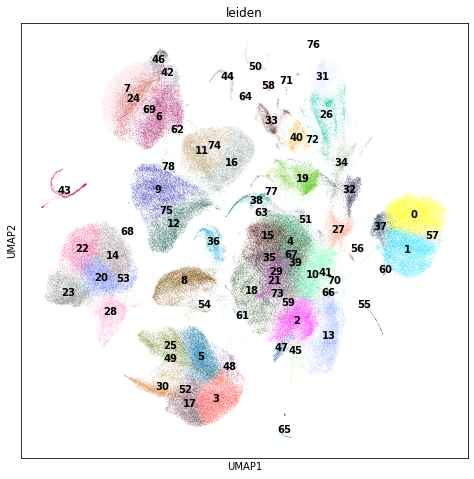

In [22]:
fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(a, color='leiden', legend_loc='on data', ax=ax)

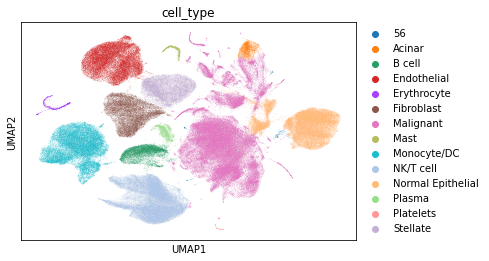

In [74]:
m = {
    'Malignant': [26, 76, 51, 38, 77, 63, 15, 4, 15, 35, 29, 21, 73, 67, 39, 10, 41, 70, 73, 59, 18, 61, 2, 47, 45, 13, 66, 70, 55, 50, 64, 58, 71, 33, 40, 72, 19, 34],
    'Normal Epithelial': [37, 60, 1, 0, 57, 27, 32],
    'Acinar': [31],
    'B cell': [8, 54],
    'Mast': [44],
    'Erythrocyte': [43],
    'Platelets': [65],
    'Plasma': [36],
    'Fibroblast': [78, 9, 75, 12],
    'Stellate': [11, 74, 16],
    'Endothelial': [46, 42, 7, 24, 69, 6, 62],
    'NK/T cell': [3, 17, 48, 5, 25, 49, 30, 52],
    'Monocyte/DC': [23, 22, 20, 14, 68, 53, 28],
}
rm = {str(c):k for k, v in m.items() for c in v}
a.obs['cell_type'] = [rm.get(c, c) for c in a.obs['leiden']]
sc.pl.umap(a, color='cell_type')

In [75]:
a.write_h5ad('../data/single_cell/annotated/initial_annotations.h5ad')

###### marker plots

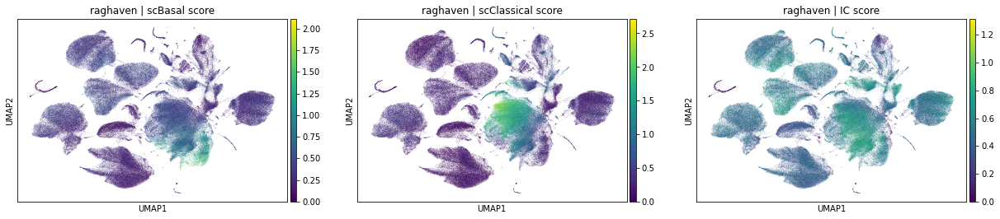

In [23]:
sc.pl.umap(a, color=['raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score'])

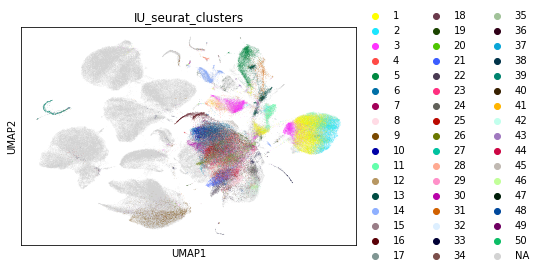

In [24]:
sc.pl.umap(a, color=['IU_seurat_clusters'])

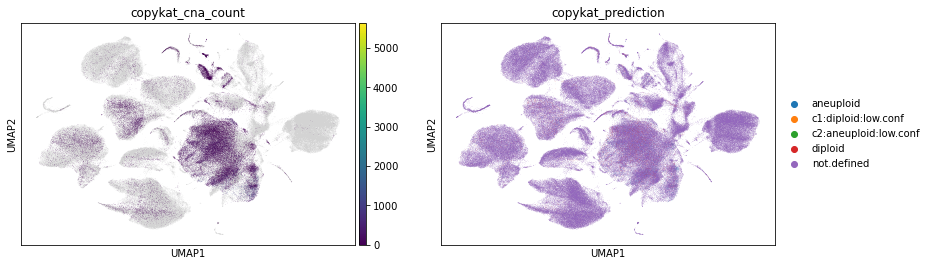

In [48]:
sc.pl.umap(a, color=['copykat_cna_count', 'copykat_prediction'])

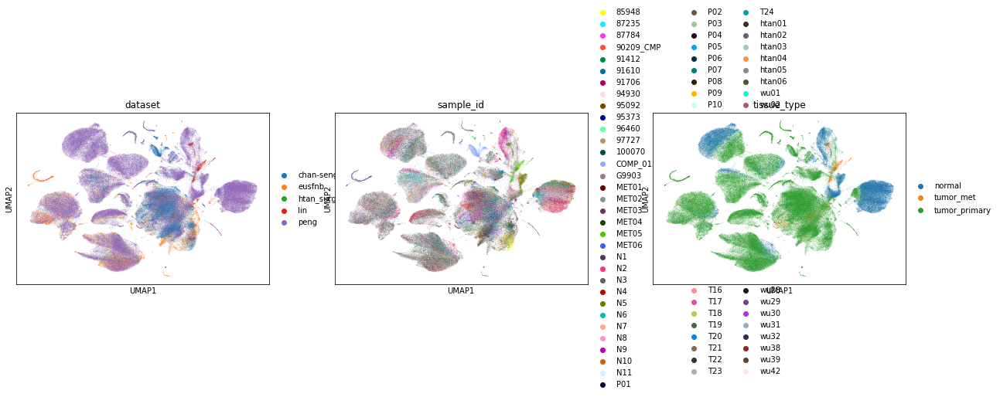

In [25]:
sc.pl.umap(a, color=['dataset', 'sample_id', 'tissue_type'])

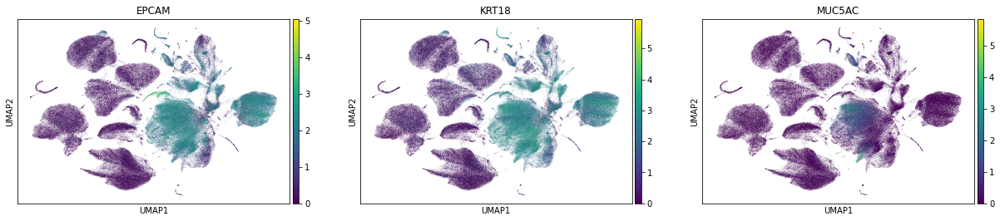

In [26]:
sc.pl.umap(a, color=['EPCAM', 'KRT18', 'MUC5AC'])

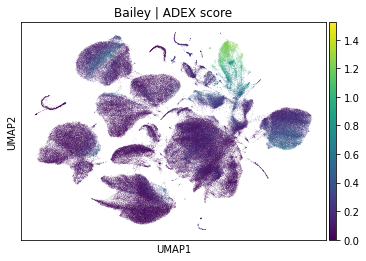

In [49]:
sc.pl.umap(a, color=['Bailey | ADEX score'])

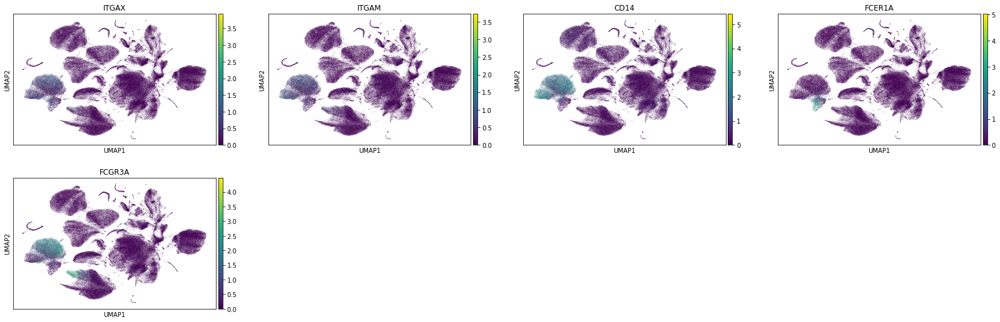

In [52]:
sc.pl.umap(a, color=['ITGAX', 'ITGAM', 'CD14', 'FCER1A', 'FCGR3A'])

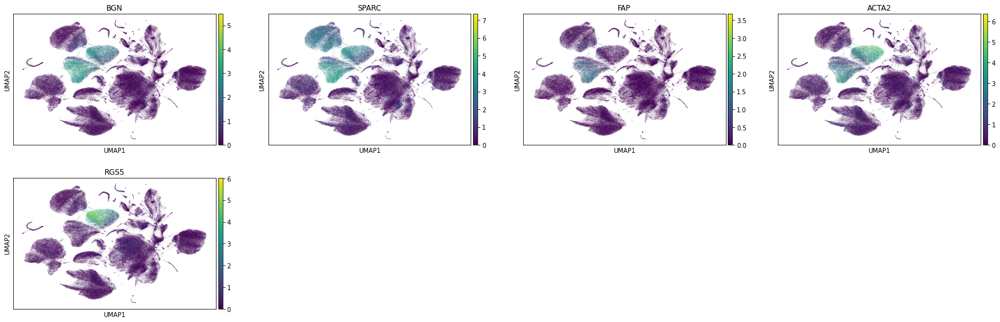

In [53]:
sc.pl.umap(a, color=['BGN', 'SPARC', 'FAP', 'ACTA2', 'RGS5'])

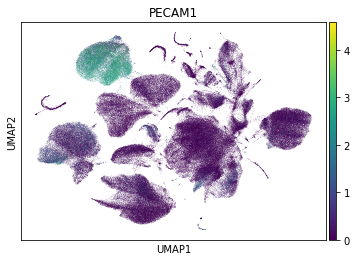

In [51]:
sc.pl.umap(a, color=['PECAM1'])

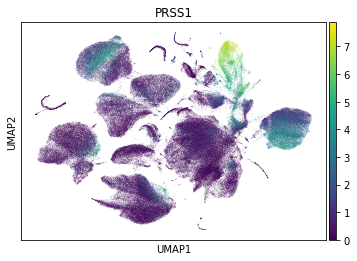

In [50]:
sc.pl.umap(a, color=['PRSS1'])

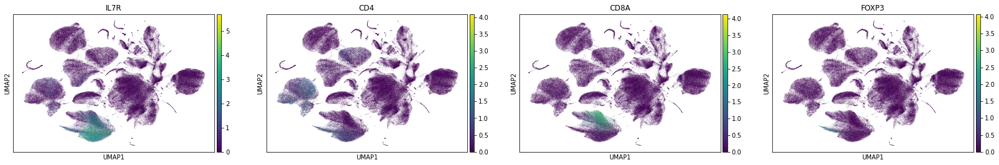

In [54]:
sc.pl.umap(a, color=['IL7R', 'CD4', 'CD8A', 'FOXP3'])

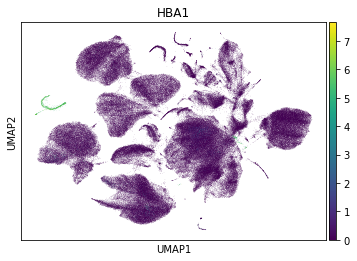

In [55]:
sc.pl.umap(a, color=['HBA1'])

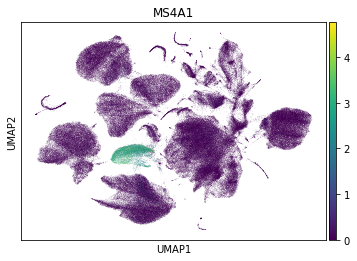

In [56]:
sc.pl.umap(a, color=['MS4A1'])

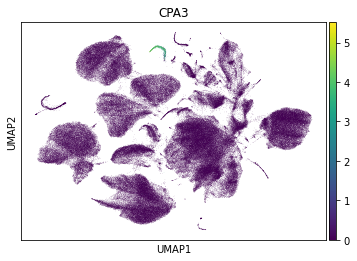

In [57]:
sc.pl.umap(a, color=['CPA3'])

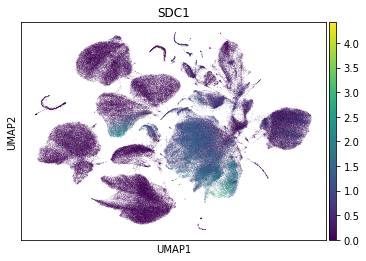

In [58]:
sc.pl.umap(a, color='SDC1')

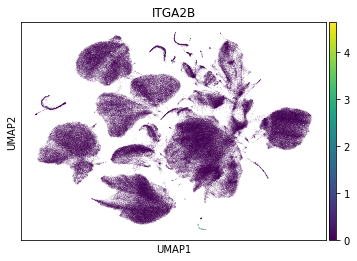

In [73]:
sc.pl.umap(a, color='ITGA2B')

In [64]:
sc.tl.rank_genes_groups(a, groupby='leiden', groups=[36])

In [68]:
a.uns['rank_genes_groups']['names']['36']

array(['JCHAIN', 'MZB1', 'IGKC', ..., 'GTF2I', 'MMP28', 'GPX1'],
      dtype=object)

In [71]:
genes = a.uns['rank_genes_groups']['names']['36'][:20]
df = een.get_pathway_enrichment(genes, gene_set_library='PanglaoDB_Augmented_2021')
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [72]:
sc.tl.rank_genes_groups(a, groupby='leiden', groups=[65])
genes = a.uns['rank_genes_groups']['names']['65'][:20]
df = een.get_pathway_enrichment(genes, gene_set_library='PanglaoDB_Augmented_2021')
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

#### Malignant subtyping

In [85]:
counts = sc.read_h5ad('../data/single_cell/original/count_matrix/counts.h5ad')
f = a[[True if ct in ['Malignant'] else False
       for ct in a.obs['cell_type']]]
f = anndata.AnnData(X=counts[f.obs.index, f.raw.var.index].X, obs=f.obs, var=f.raw.var)
sc.pp.filter_genes(f, min_cells=3)
f

AnnData object with n_obs × n_vars = 93694 × 28587
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score',

In [210]:
f = apply_normalization(f)
f = apply_batch_correction(f)
f = apply_clustering(f, res=1., n_pcs=15)
f

running nbhrs
running umap
running leiden


AnnData object with n_obs × n_vars = 93694 × 3000
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score', 

In [ ]:
# score_signatures(f, gene_sets)

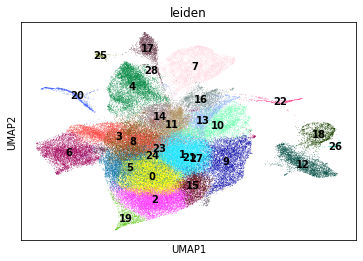

In [211]:
sc.pl.umap(f, color='leiden', legend_loc='on data')

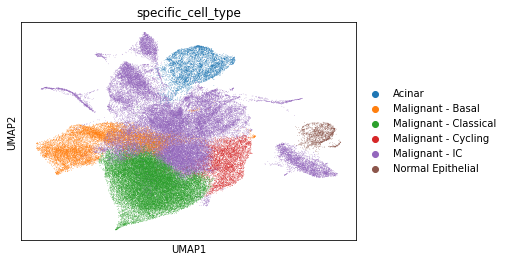

In [227]:
m = {
    'Malignant - IC': [24, 28, 25, 23, 20, 8, 17, 4, 12, 10, 22, 13, 16, 14, 11, 1, 21, 27],
    'Malignant - Classical': [19, 2, 0, 5, 15],
    'Acinar': [7],
    'Normal Epithelial': [18, 26],
    'Malignant - Basal': [6, 3],
    'Malignant - Cycling': [9],

}
rm = {str(c):k for k, v in m.items() for c in v}
f.obs['specific_cell_type'] = [rm.get(c, c) for c in f.obs['leiden']]
if 'specific_cell_type_colors' in f.uns: f.uns.pop('specific_cell_type_colors')
sc.pl.umap(f, color='specific_cell_type')

In [228]:
f.write_h5ad('../data/single_cell/annotated/malignant_annotations.h5ad')

###### marker inspection

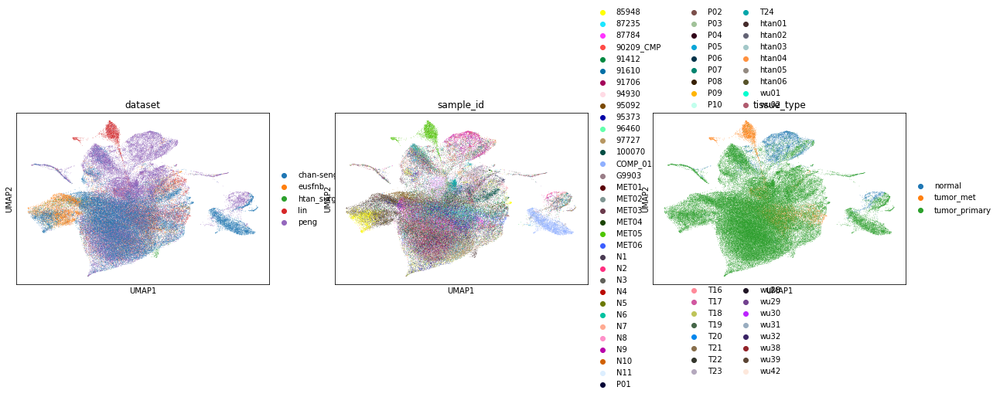

In [221]:
sc.pl.umap(f, color=['dataset', 'sample_id', 'tissue_type'])

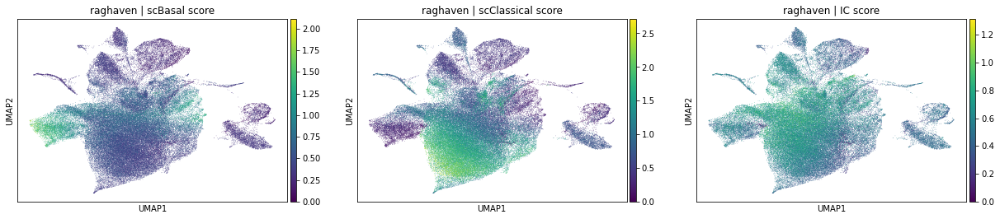

In [212]:
sc.pl.umap(f, color=['raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score'])

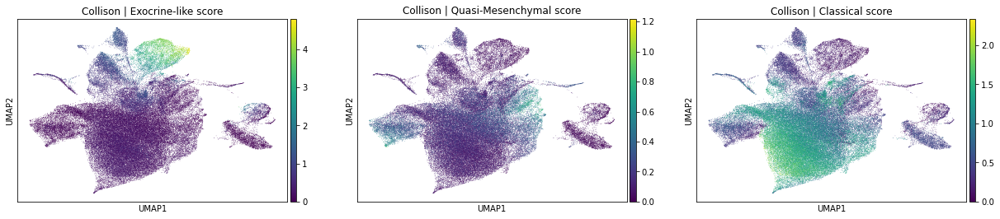

In [213]:
sc.pl.umap(f, color=['Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score'])

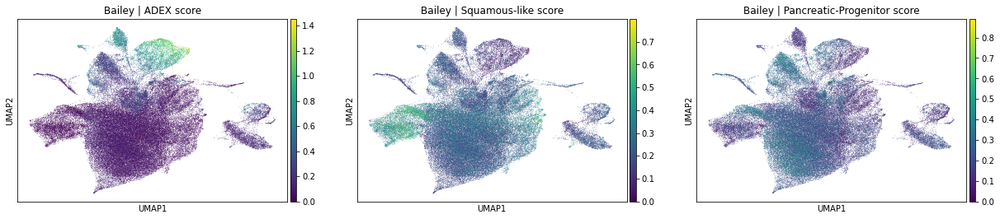

In [214]:
sc.pl.umap(f, color=['Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score'])


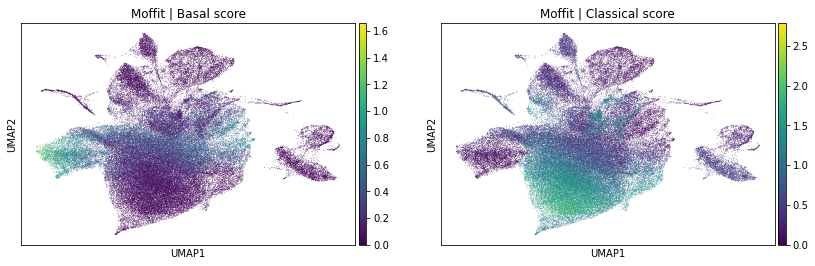

In [215]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'Moffit' in c])


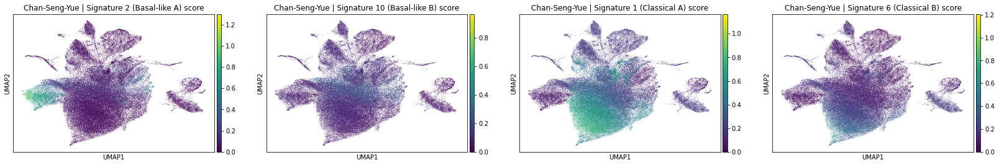

In [216]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'Chan' in c])


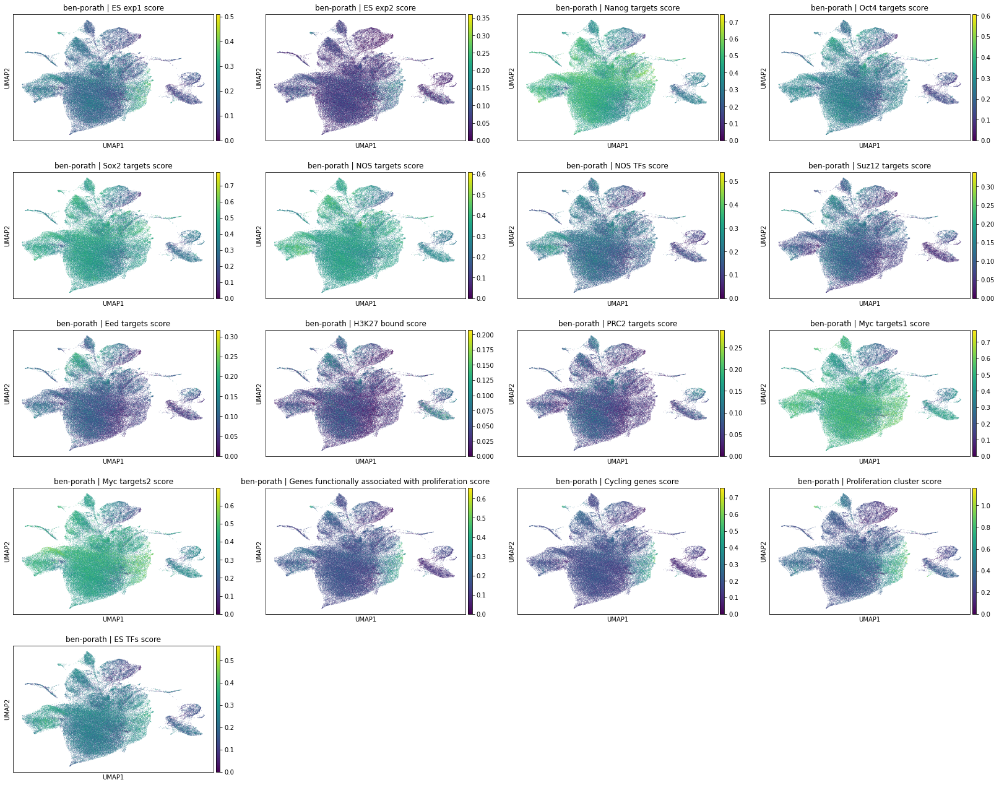

In [217]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'ben-porath' in c])


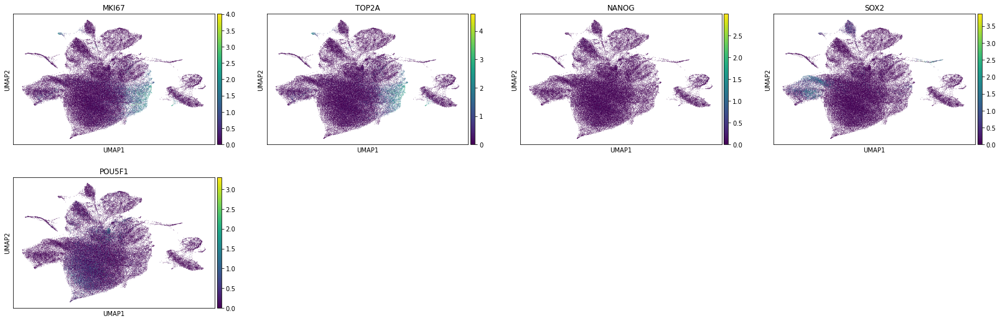

In [218]:
sc.pl.umap(f, color=['MKI67', 'TOP2A', 'NANOG', 'SOX2', 'POU5F1'])


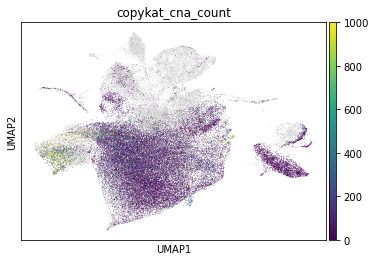

In [219]:
sc.pl.umap(f, color=['copykat_cna_count'], vmax=1000)

In [95]:
gene_sets['Bailey'].keys()

dict_keys(['ADEX', 'Squamous-like', 'Pancreatic-Progenitor', 'Immunogenic'])

In [97]:
gene_sets.keys()

dict_keys(['Bailey', 'Collison', 'Moffit', 'subTME', 'raghaven', 'elyada', 'ben-porath', 'wong', 'sanchez-vega', 'Chan-Seng-Yue', 'luoma'])

#### Fibroblast subtyping

In [149]:
counts = sc.read_h5ad('../data/single_cell/original/count_matrix/counts.h5ad')
f = a[[True if ct in ['Fibroblast'] else False
       for ct in a.obs['cell_type']]]
f = anndata.AnnData(X=counts[f.obs.index, f.raw.var.index].X, obs=f.obs, var=f.raw.var)
sc.pp.filter_genes(f, min_cells=3)
f

AnnData object with n_obs × n_vars = 16539 × 23065
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score',

In [150]:
f = apply_normalization(f)
f = apply_batch_correction(f)
f = apply_clustering(f, res=1., n_pcs=15)
f

normalizing


/diskmnt/Projects/Users/estorrs/miniconda3/envs/single-cell-pdac/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


running pca
running harmony


2022-08-18 19:07:04,058 - harmonypy - INFO - Iteration 1 of 10
2022-08-18 19:07:13,354 - harmonypy - INFO - Iteration 2 of 10
2022-08-18 19:07:22,432 - harmonypy - INFO - Iteration 3 of 10
2022-08-18 19:07:31,278 - harmonypy - INFO - Iteration 4 of 10
2022-08-18 19:07:40,206 - harmonypy - INFO - Iteration 5 of 10
2022-08-18 19:07:48,928 - harmonypy - INFO - Iteration 6 of 10
2022-08-18 19:07:56,080 - harmonypy - INFO - Iteration 7 of 10
2022-08-18 19:08:04,830 - harmonypy - INFO - Converged after 7 iterations


running nbhrs
running umap
running leiden


AnnData object with n_obs × n_vars = 16539 × 3000
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score', 

In [151]:
# score_signatures(f, gene_sets)

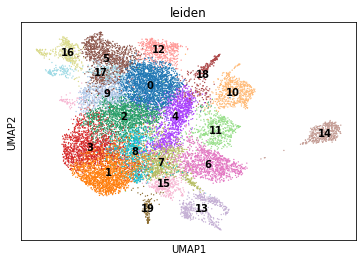

In [152]:
sc.pl.umap(f, color='leiden', legend_loc='on data')

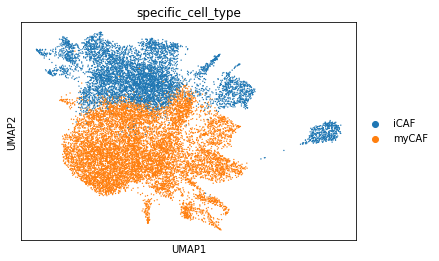

In [158]:
m = {
    'myCAF': [4, 11, 2, 3, 1, 8, 7, 15, 13, 19, 6],
    'iCAF': [0, 9, 17, 5, 16, 12, 18, 10, 14],
}
rm = {str(c):k for k, v in m.items() for c in v}
f.obs['specific_cell_type'] = [rm.get(c, c) for c in f.obs['leiden']]
if 'specific_cell_type_colors' in f.uns: f.uns.pop('specific_cell_type_colors')
sc.pl.umap(f, color='specific_cell_type')

In [159]:
f.write_h5ad('../data/single_cell/annotated/fibroblast_annotations.h5ad')

###### marker plots

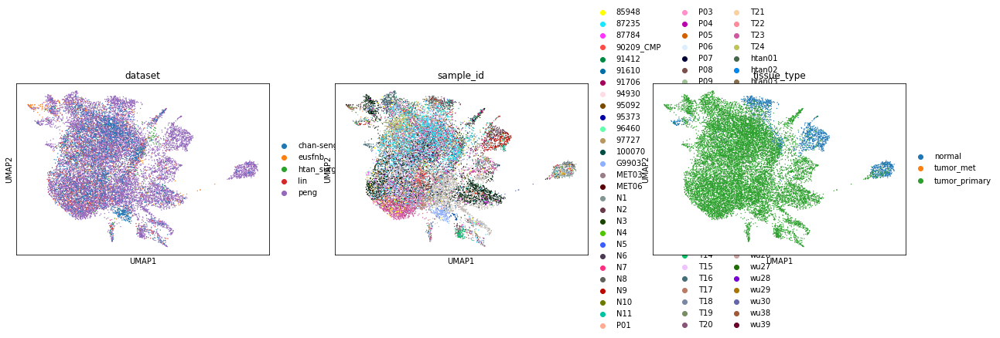

In [153]:
sc.pl.umap(f, color=['dataset', 'sample_id', 'tissue_type'])

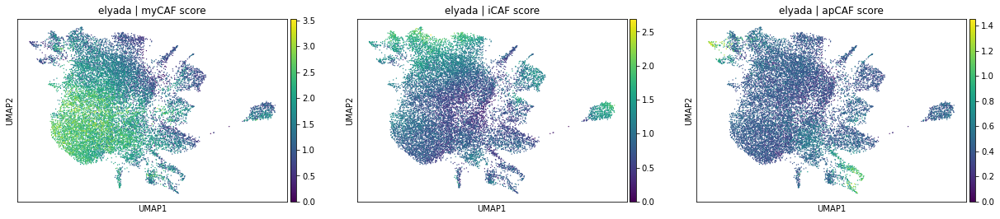

In [154]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'lyada' in c])


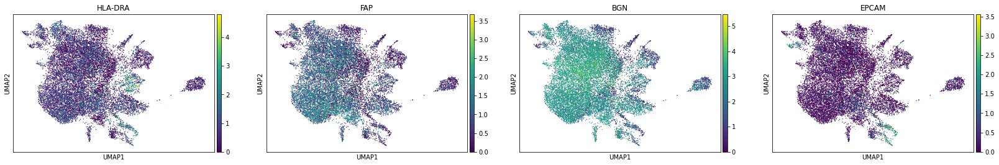

In [156]:
sc.pl.umap(f, color=['HLA-DRA', 'FAP', 'BGN', 'EPCAM'])


In [140]:
gene_sets['luoma'].keys()

dict_keys(['CD4_T_cell - IL7R+ CD4', 'CD4_T_cell - OX40+ Treg', 'CD4_T_cell - HLA-DR+ Treg', 'CD4_T_cell - CXCL+ CD4', 'CD4_T_cell - Cycling CD4', 'CD4_T_cell - GZMA+ CD4', 'CD4_T_cell - ISG CD4', 'CD8_T_cell - KLF2-high CD8', 'CD8_T_cell - GZMK+ CD8', 'CD8_T_cell - ITGAE+ CD8', 'CD8_T_cell - Cycling CD8', 'CD8_T_cell - IL7R+ CD8', 'CD8_T_cell - ISG CD8', 'CD8_T_cell - CD3D+ CD8', 'myeloid_cell - CD14+ Mono', 'myeloid_cell - C1QB+ TAM', 'myeloid_cell - CXCL8+ TAM', 'myeloid_cell - Unassigned', 'myeloid_cell - CD1C+ DC', 'myeloid_cell - pDC', 'myeloid_cell - SPP1+ TAM', 'myeloid_cell - LAMP3+ DC', 'myeloid_cell - CLEC9A+ DC', 'immune_activity_scores - Tissue-resident memory ', 'immune_activity_scores - Cytotoxicity ', 'immune_activity_scores - NK cell receptors ', 'immune_activity_scores - Inhibitory Receptors ', 'Tx_signatures - Tx-E T cell Post-Tx signature ', 'Tx_signatures - Tx-NE T cell Post-Tx signature ', 'Tx_signatures - Tx-E T cell Pre-Tx signature ', 'Tx_signatures - Tx-NE T c

#### Monocyte/DC subtyping

In [160]:
counts = sc.read_h5ad('../data/single_cell/original/count_matrix/counts.h5ad')
f = a[[True if ct in ['Monocyte/DC'] else False
       for ct in a.obs['cell_type']]]
f = anndata.AnnData(X=counts[f.obs.index, f.raw.var.index].X, obs=f.obs, var=f.raw.var)
sc.pp.filter_genes(f, min_cells=3)
f

AnnData object with n_obs × n_vars = 28796 × 22896
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score',

In [161]:
f = apply_normalization(f)
f = apply_batch_correction(f)
f = apply_clustering(f, res=1., n_pcs=15)
f

normalizing


/diskmnt/Projects/Users/estorrs/miniconda3/envs/single-cell-pdac/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


running pca
running harmony


2022-08-18 19:28:06,354 - harmonypy - INFO - Iteration 1 of 10
2022-08-18 19:28:23,737 - harmonypy - INFO - Iteration 2 of 10
2022-08-18 19:28:42,561 - harmonypy - INFO - Iteration 3 of 10
2022-08-18 19:29:01,476 - harmonypy - INFO - Iteration 4 of 10
2022-08-18 19:29:19,099 - harmonypy - INFO - Iteration 5 of 10
2022-08-18 19:29:35,179 - harmonypy - INFO - Iteration 6 of 10
2022-08-18 19:29:53,998 - harmonypy - INFO - Iteration 7 of 10
2022-08-18 19:30:07,881 - harmonypy - INFO - Converged after 7 iterations


running nbhrs
running umap
running leiden


AnnData object with n_obs × n_vars = 28796 × 3000
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score', 

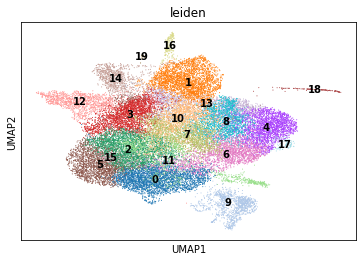

In [162]:
sc.pl.umap(f, color='leiden', legend_loc='on data')

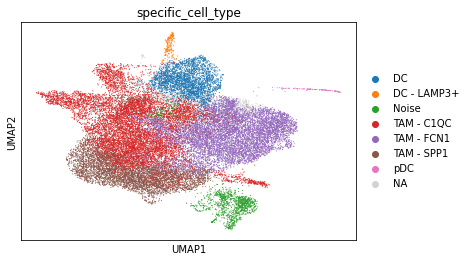

In [173]:
m = {
    'DC': [1],
    'TAM - FCN1': [17, 4, 8, 6, 7],
    'pDC': [18],
    'TAM - SPP1': [0, 5, 15],
    'DC - LAMP3+': [16],
    'TAM - C1QC': [14, 12, 3, 10, 2, 11],
    'Noise': [9]
}
rm = {str(c):k for k, v in m.items() for c in v}
f.obs['specific_cell_type'] = [rm.get(c) for c in f.obs['leiden']]
sc.pl.umap(f, color='specific_cell_type')

In [174]:
f.write_h5ad('../data/single_cell/annotated/monocyte_annotations.h5ad')

###### marker plots

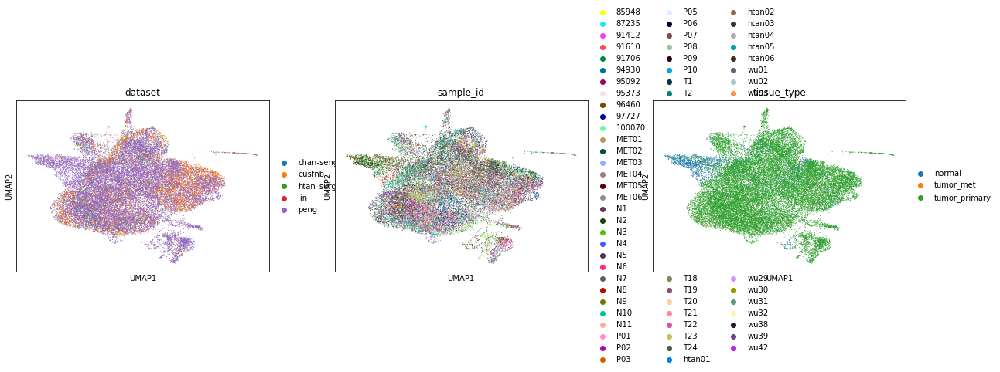

In [163]:
sc.pl.umap(f, color=['dataset', 'sample_id', 'tissue_type'])

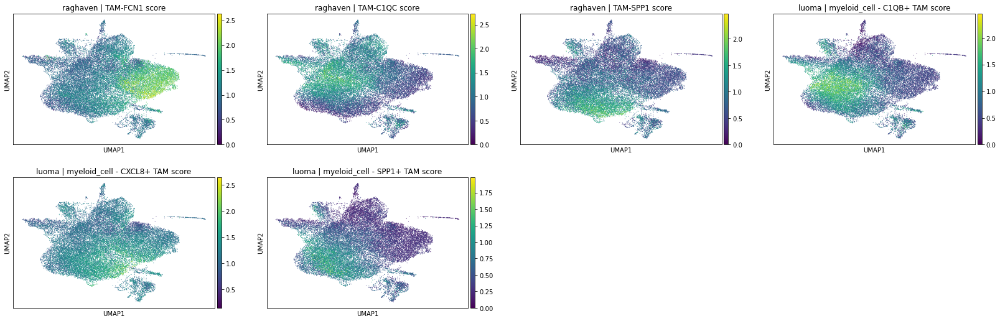

In [164]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'TAM' in c])


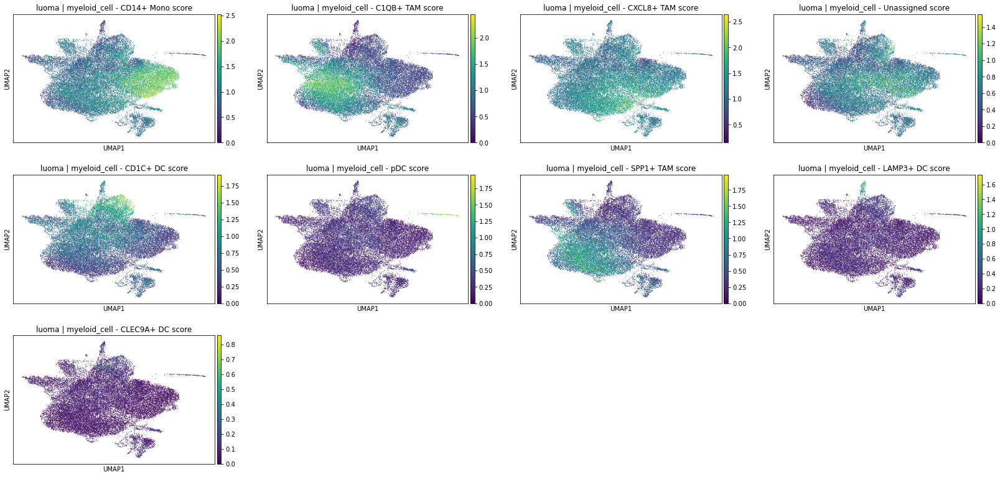

In [165]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'myeloid_cell' in c])


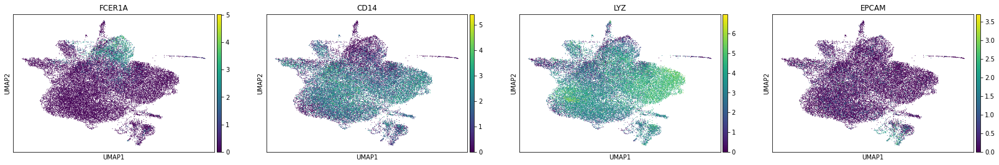

In [172]:
sc.pl.umap(f, color=['FCER1A', 'CD14', 'LYZ', 'EPCAM'])


In [171]:
sc.tl.rank_genes_groups(f, groupby='leiden', groups=[9])
genes = f.uns['rank_genes_groups']['names']['9'][:20]
df = een.get_pathway_enrichment(genes, gene_set_library='PanglaoDB_Augmented_2021')
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

#### NK/T cell annotations

In [175]:
counts = sc.read_h5ad('../data/single_cell/original/count_matrix/counts.h5ad')
f = a[[True if ct in ['NK/T cell'] else False
       for ct in a.obs['cell_type']]]
f = anndata.AnnData(X=counts[f.obs.index, f.raw.var.index].X, obs=f.obs, var=f.raw.var)
sc.pp.filter_genes(f, min_cells=3)
f

AnnData object with n_obs × n_vars = 38013 × 21984
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score',

In [194]:
f = apply_normalization(f)
f = apply_batch_correction(f)
f = apply_clustering(f, res=1.5, n_pcs=10)
f

running nbhrs
running umap
running leiden


AnnData object with n_obs × n_vars = 38013 × 3000
    obs: 'sample_id', 'dataset', 'tissue_type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Bailey | ADEX score', 'Bailey | Squamous-like score', 'Bailey | Pancreatic-Progenitor score', 'Bailey | Immunogenic score', 'Collison | Exocrine-like score', 'Collison | Quasi-Mesenchymal score', 'Collison | Classical score', 'Moffit | Basal score', 'Moffit | Classical score', 'subTME | deserted score', 'subTME | reactive score', 'raghaven | scBasal score', 'raghaven | scClassical score', 'raghaven | IC score', 'raghaven | Pericyte-like score', 'raghaven | Fibroblast-like score', 'raghaven | Inflammatory score', 'raghaven | TAM-FCN1 score', 'raghaven | TAM-C1QC score', 'raghaven | TAM-SPP1 score', 'elyada | myCAF score', 'elyada | iCAF score', 'elyada | apCAF score', 'ben-porath | ES exp1 score', 'ben-porath | ES exp2 score', 'ben-porath | Nanog targets score', 'ben-porath | Oct4 targets score', 

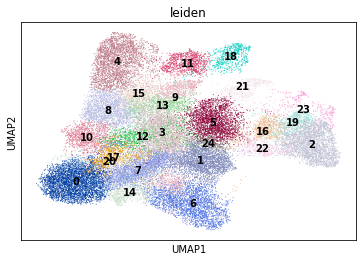

In [195]:
sc.pl.umap(f, color='leiden', legend_loc='on data')

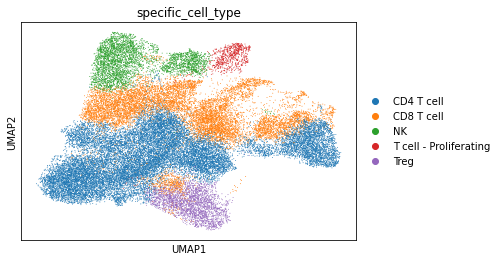

In [207]:
m = {
    'NK': [4, 11],
    'CD8 T cell - Exhausted': [9, 13],
    'CD8 T cell ': [8, 15, 13, 9, 5, 21, 16, 19, 23],
    'T cell - Proliferating': [18],
    'Treg': [6],
    'CD4 T cell': [0, 10, 20, 17, 7, 14, 1, 24, 3, 12, 22, 2],    
}
rm = {str(c):k for k, v in m.items() for c in v}
if 'specific_cell_type_colors' in f.uns: f.uns.pop('specific_cell_type_colors')
f.obs['specific_cell_type'] = [rm.get(c) for c in f.obs['leiden']]
sc.pl.umap(f, color='specific_cell_type')

In [208]:
f.write_h5ad('../data/single_cell/annotated/t_annotations.h5ad')

###### marker plots

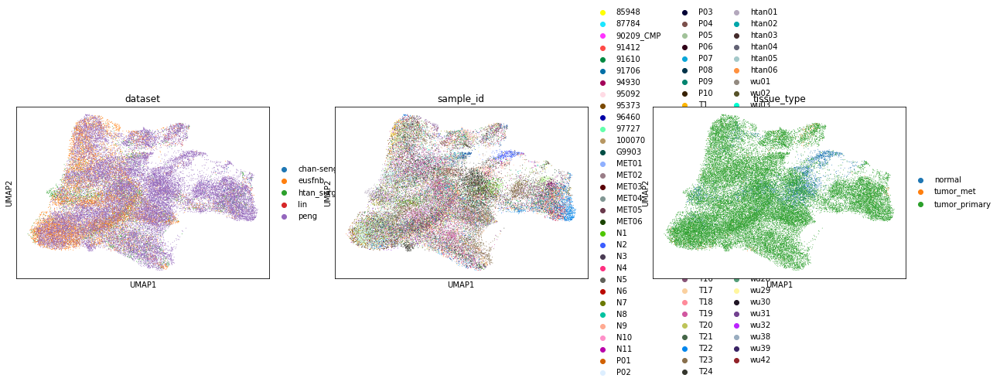

In [196]:
sc.pl.umap(f, color=['dataset', 'sample_id', 'tissue_type'])

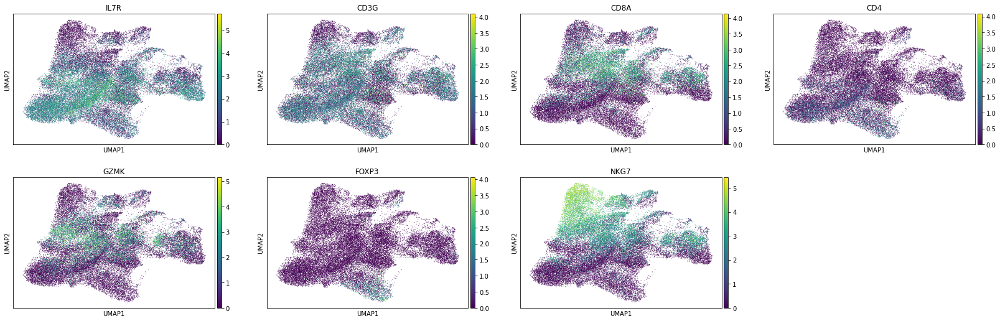

In [197]:
sc.pl.umap(f, color=['IL7R', 'CD3G', 'CD8A', 'CD4', 'GZMK', 'FOXP3', 'NKG7'])


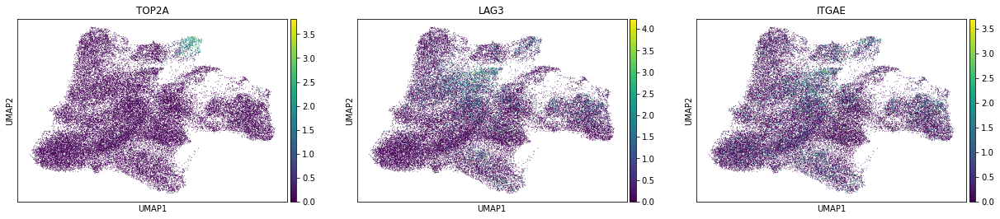

In [198]:
sc.pl.umap(f, color=['TOP2A', 'LAG3', 'ITGAE'])

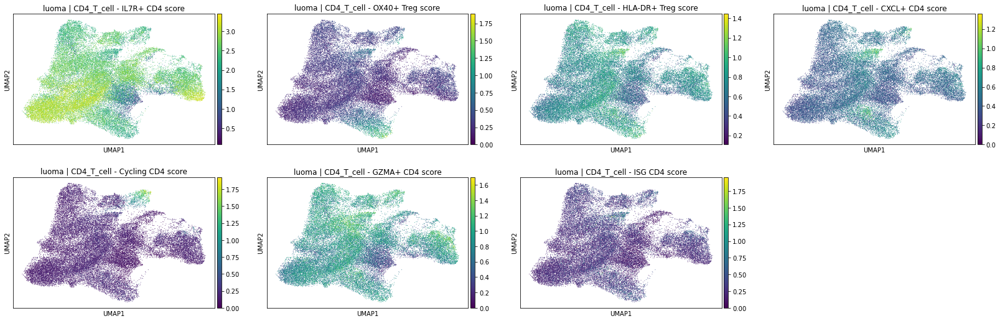

In [199]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'CD4' in c])


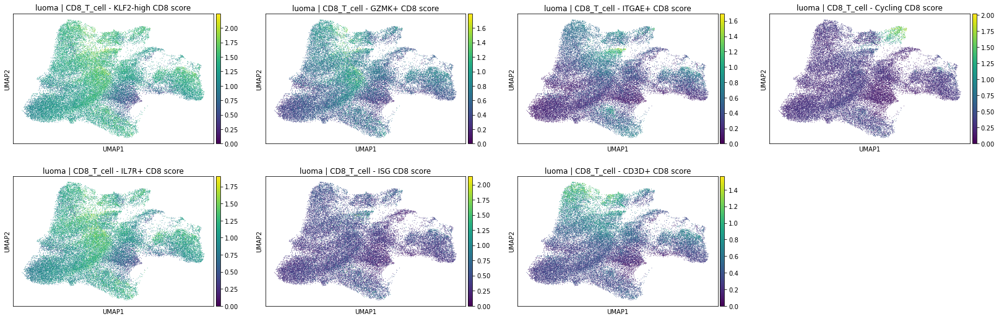

In [200]:
sc.pl.umap(f, color=[c for c in f.obs.columns if 'CD8' in c])


#### merge back together

In [230]:
combined = sc.read_h5ad('../data/single_cell/annotated/initial_annotations.h5ad')
malignant = sc.read_h5ad('../data/single_cell/annotated/malignant_annotations.h5ad')
fibroblast = sc.read_h5ad('../data/single_cell/annotated/fibroblast_annotations.h5ad')
mono = sc.read_h5ad('../data/single_cell/annotated/monocyte_annotations.h5ad')
t = sc.read_h5ad('../data/single_cell/annotated/t_annotations.h5ad')

In [232]:
cell_type_specific = []
for cid, ct in zip(combined.obs.index, combined.obs['cell_type']):
    if ct == 'Malignant':
        cell_type_specific.append(malignant.obs.loc[cid, 'specific_cell_type'])
    elif ct == 'Fibroblast':
        cell_type_specific.append(fibroblast.obs.loc[cid, 'specific_cell_type'])
    elif ct == 'Monocyte/DC':
        cell_type_specific.append(mono.obs.loc[cid, 'specific_cell_type'])
    elif ct == 'NK/T cell':
        cell_type_specific.append(t.obs.loc[cid, 'specific_cell_type'])
    else:
        cell_type_specific.append(ct)
combined.obs['cell_type_specific'] = cell_type_specific

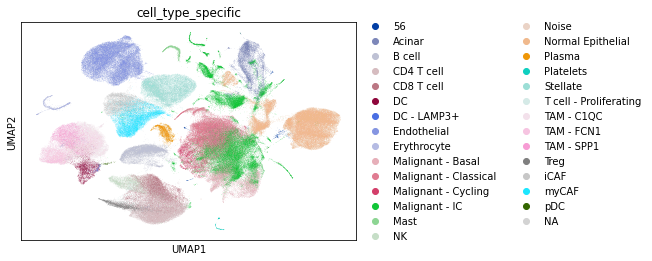

In [233]:
sc.pl.umap(combined, color='cell_type_specific')

In [234]:
combined.write_h5ad('../data/single_cell/annotated/all_annotated.h5ad')